In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
        # print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session
# import kagglehub

# # Download latest version
# path = kagglehub.dataset_download("./rice-leaf-diseases-dataset")

# print("Path to dataset files:", path)

In [2]:
print("hello")
import sys
print(sys.version)


hello
3.10.2 (tags/v3.10.2:a58ebcc, Jan 17 2022, 14:12:15) [MSC v.1929 64 bit (AMD64)]


In [3]:
# ! pip install tensorflow-model-optimization
# ! pip install vitis-ai-tensorflow
# ! pip install tf-keras

In [4]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.applications import ResNet50, VGG16, MobileNetV2, EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
from lime import lime_image
from skimage.segmentation import mark_boundaries
from tensorflow.keras.applications.resnet50 import preprocess_input
from sklearn.metrics import confusion_matrix
# import tensorflow_model_optimization as tfmot
# from tensorflow_model_optimization import sparsity
# import tf_keras as keras
import numpy as np
import time
import os
import tempfile
import zipfile
from collections import Counter
from sklearn.model_selection import train_test_split

!pip install seaborn
import seaborn as sns


[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:
# dataset_path = '/kaggle/input/rice-leaf-diseases-dataset/rice leaf diseases dataset/'
dataset_path="./rice leaf diseases dataset"
print(dataset_path)

./rice leaf diseases dataset


In [6]:
# Set parameters
BATCH_SIZE = 128
IMG_SIZE = (224, 224)  # Standard for pre-trained models
EPOCHS = 8

In [7]:



AUTOTUNE = tf.data.AUTOTUNE

# 1. Get image paths and labels
def get_image_paths_and_labels(dataset_path):
    class_names = sorted(os.listdir(dataset_path))
    filepaths = []
    labels = []
    for idx, class_name in enumerate(class_names):
        class_dir = os.path.join(dataset_path, class_name)
        for fname in os.listdir(class_dir):
            if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
                filepaths.append(os.path.join(class_dir, fname))
                labels.append(idx)
    return np.array(filepaths), np.array(labels), class_names

filepaths, labels, class_names = get_image_paths_and_labels(dataset_path)

# 2. Stratified split
X_train, X_val, y_train, y_val = train_test_split(
    filepaths, labels, 
    test_size=0.3, 
    stratify=labels, 
    random_state=42
)

# 3. Image loading and preprocessing
def process_image(file_path, label):
    img = tf.io.read_file(file_path)
    img = tf.image.decode_jpeg(img, channels=3)
    
    img = tf.image.resize(img, IMG_SIZE)
    img = img / 255.0  # Normalize
    return img, label

# 4. Build Datasets
train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.map(process_image, num_parallel_calls=AUTOTUNE)
train_ds = train_ds.shuffle(buffer_size=1000).batch(BATCH_SIZE).prefetch(AUTOTUNE)

val_ds = tf.data.Dataset.from_tensor_slices((X_val, y_val))
val_ds = val_ds.map(process_image, num_parallel_calls=AUTOTUNE)
val_ds = val_ds.batch(BATCH_SIZE).prefetch(AUTOTUNE)

In [8]:
# print(class_labels)
y_true = np.concatenate([y for x, y in val_ds])
print(y_true.shape)

(5210,)


In [9]:
print(y_true[:20])

[ 5  8  9  9 10  1  2  8  6  4  7  2 10  9  1  3  9  0  9  3]


In [12]:
# Function to compute confusion matrix
def plot_confusion_matrix(y_true, y_pred, model_name):
    cm = confusion_matrix(y_true, y_pred)
    print("Confusion Matrix",cm)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix - {model_name}")
    plt.show()

### models

In [15]:
import ssl
ssl._create_default_https_context = ssl._create_unverified_context


## Transformer Models

In [33]:
# ! pip install torch torchvision transformers datasets timm


In [34]:
import torch
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Subset
from transformers import DeiTForImageClassification, BeitForImageClassification, AutoImageProcessor
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import StratifiedShuffleSplit

import matplotlib.pyplot as plt
import torch.nn.functional as F

In [35]:
# For transformer models
def get_all_predictions(model, data_loader):
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images).logits
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    return all_labels, all_preds


In [36]:
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define dataset path
dataset_path = "./rice leaf diseases dataset"

# Define transforms
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

# Load full dataset
full_dataset = ImageFolder(root=dataset_path, transform=transform)
num_classes = len(full_dataset.classes)
print("NUM OF CLASS:", num_classes)

# Extract targets (class indices) for stratification
targets = [sample[1] for sample in full_dataset.samples]

# Create stratified split
splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)
train_idx, val_idx = next(splitter.split(np.zeros(len(targets)), targets))

# Create subset datasets
train_dataset = Subset(full_dataset, train_idx)
val_dataset = Subset(full_dataset, val_idx)

# Data loaders
BATCH_SIZE = 32
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

NUM OF CLASS: 11


In [39]:
import torch
import time
import os
from torch import nn, optim

from transformers import DeiTForImageClassification, BeitForImageClassification, SwinForImageClassification

# Function to get model size
def get_model_size(model, filename="temp_model.pth"):
    torch.save(model.state_dict(), filename)
    size_mb = os.path.getsize(filename) / (1024 * 1024)  # Convert to MB
    os.remove(filename)  # Clean up file
    return size_mb

# Function to measure inference time
def measure_inference_time(model, sample_input, num_runs=100):
    model.eval()
    with torch.no_grad():
        start_time = time.time()
        for _ in range(num_runs):
            _ = model(sample_input).logits
        end_time = time.time()
    return (end_time - start_time) / num_runs  # Average time per inference

# Apply quantization to shrink the model
def quantize_model(model):
    model = torch.quantization.quantize_dynamic(model, {nn.Linear}, dtype=torch.qint8)
    return model

    


# Train and validate models
# Function to calculate accuracy
def calculate_accuracy(model, data_loader):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images).logits
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)
    return correct / total


# Train and validate models
def train_and_validate_model(model, optimizer, num_epochs=20):
    for epoch in range(num_epochs):
        model.train()
        correct_train = 0
        total_train = 0
        running_loss = 0.0
        
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images).logits
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            # Compute training accuracy
            _, predicted = torch.max(outputs, 1)
            correct_train += (predicted == labels).sum().item()
            total_train += labels.size(0)
            running_loss += loss.item()

        train_accuracy = correct_train / total_train
        val_accuracy = calculate_accuracy(model, val_loader)
        avg_loss = running_loss / len(train_loader)
        
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {avg_loss:.4f}, "
              f"Training Accuracy: {train_accuracy:.4f}, Validation Accuracy: {val_accuracy:.4f}")

    # Output model size after training
    size_before = get_model_size(model)
    print(f"Model size before quantization: {size_before:.2f} MB")
    
    
    return model


# Load and process models
deit_model = DeiTForImageClassification.from_pretrained("facebook/deit-base-distilled-patch16-224", num_labels=num_classes).to(device)
beit_model = BeitForImageClassification.from_pretrained("microsoft/beit-base-patch16-224", num_labels=num_classes, ignore_mismatched_sizes=True).to(device)
swin_model = SwinForImageClassification.from_pretrained("microsoft/swin-base-patch4-window7-224", num_labels=num_classes,  ignore_mismatched_sizes=True).to(device)
# Load lightweight Swin model (Swin-Tiny)
swin_tiny_model = SwinForImageClassification.from_pretrained("microsoft/swin-tiny-patch4-window7-224",num_labels=num_classes,ignore_mismatched_sizes=True).to(device)


criterion = nn.CrossEntropyLoss()

learning_rate = 2e-5

#Tested Learning rate = 0.02, 0.0008

optimizer_deit = optim.AdamW(deit_model.parameters(), lr=learning_rate)
optimizer_beit = optim.AdamW(beit_model.parameters(), lr=learning_rate)
optimizer_swin = optim.AdamW(swin_model.parameters(), lr=learning_rate)
optimizer_swin_tiny = optim.AdamW(swin_tiny_model.parameters(), lr=learning_rate)


#Num of EPOHCS -
epochs = 10


print("Training and validating Lightweight Swin Transformer (Swin-Tiny)...")
swin_tiny_model = train_and_validate_model(swin_tiny_model, optimizer_swin_tiny, 9)

print("Training and validating DEiT...")
deit_model = train_and_validate_model(deit_model, optimizer_deit,4)

print("Training and validating BEiT...")
beit_model = train_and_validate_model(beit_model, optimizer_beit,3)

print("Training and validating Swin Transformer V2...")
swin_model = train_and_validate_model(swin_model, optimizer_swin,10)



Some weights of DeiTForImageClassification were not initialized from the model checkpoint at facebook/deit-base-distilled-patch16-224 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of BeitForImageClassification were not initialized from the model checkpoint at microsoft/beit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([11]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([11, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of SwinForImageClassification were not initialized from the model checkpoint at microsoft/swin-base-patch4-window7-224 and are newly ini

Training and validating Lightweight Swin Transformer (Swin-Tiny)...
Epoch 1/9, Loss: 0.3857, Training Accuracy: 0.8841, Validation Accuracy: 0.9783
Epoch 2/9, Loss: 0.0491, Training Accuracy: 0.9854, Validation Accuracy: 0.9875
Epoch 3/9, Loss: 0.0259, Training Accuracy: 0.9926, Validation Accuracy: 0.9866
Epoch 4/9, Loss: 0.0105, Training Accuracy: 0.9972, Validation Accuracy: 0.9841
Epoch 5/9, Loss: 0.0121, Training Accuracy: 0.9973, Validation Accuracy: 0.9929
Epoch 6/9, Loss: 0.0039, Training Accuracy: 0.9993, Validation Accuracy: 0.9931
Epoch 7/9, Loss: 0.0088, Training Accuracy: 0.9975, Validation Accuracy: 0.9929
Epoch 8/9, Loss: 0.0024, Training Accuracy: 0.9996, Validation Accuracy: 0.9956
Epoch 9/9, Loss: 0.0009, Training Accuracy: 0.9999, Validation Accuracy: 0.9960
Model size before quantization: 105.32 MB
Training and validating DEiT...
Epoch 1/4, Loss: 0.2641, Training Accuracy: 0.9250, Validation Accuracy: 0.9848
Epoch 2/4, Loss: 0.0208, Training Accuracy: 0.9947, Valida

## Explainilibity CODE

In [40]:
# print(deit_model)

image_paths = {
    "Brown Spot":"./rice leaf diseases dataset/Brownspot/Brownspot (2).jpg",
    "Tungro":"./rice leaf diseases dataset/tungro/tungro12.jpg",
    "Leaf Smut":"./rice leaf diseases dataset/Leafsmut/Leafsmut (43).JPG",
    "Leaf Blast":"./rice leaf diseases dataset/leaf_blast/leaf_blast5.jpg"
}

In [41]:
! pip install timm



[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [42]:
from PIL import Image
import cv2


def get_deit_attention_rollout(model, image_path, transform, device,model_name="deit"):
    model.eval()
    
    # Load and preprocess image
    image = Image.open(image_path).convert('RGB')
    input_tensor = transform(image).unsqueeze(0).to(device)
    
    # Forward pass with attention outputs
    with torch.no_grad():
        outputs = model(input_tensor, output_attentions=True)
        attentions = outputs.attentions  # Tuple of (layer, B, Heads, Tokens, Tokens)

    # Perform attention rollout
    num_tokens = attentions[0].size(-1)  # Should be 198 for distilled DeiT
    result = torch.eye(num_tokens).to(device)
    for attn in attentions:
        attn_heads_fused = attn[0].mean(dim=0)  # (Tokens, Tokens)
        attn_heads_fused = attn_heads_fused / attn_heads_fused.sum(dim=-1, keepdim=True)
        result = attn_heads_fused @ result

    # Get attention from CLS token
    class_attn = result[0]  # Shape: (198,)

    # Skip both CLS and DISTILL tokens
    if model_name=="deit":
        patch_attn = class_attn[2:]  # Shape: (196,)

        

    # For beit do this
    elif model_name=="beit":
        patch_attn = class_attn[1:]
        
    # patch_attn = class_attn[1:]  # For BEiT (skip CLS only)


    if patch_attn.shape[0] != 196:
        raise ValueError(f"Expected 196 patch tokens, got {patch_attn.shape[0]}")

    # Reshape to 14x14
    mask = patch_attn.reshape(14, 14).cpu().numpy()

    # Normalize and convert to heatmap
    mask = (mask - mask.min()) / (mask.max() - mask.min())
    heatmap = cv2.resize(mask, image.size)
    heatmap = (heatmap * 255).astype(np.uint8)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Blend with original image
    image_np = np.array(image)
    overlay = cv2.addWeighted(image_np, 0.6, heatmap, 0.4, 0)

    # Show
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(image_np)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title("Attention Rollout (DeiT)")
    plt.imshow(overlay)
    plt.axis("off")
    plt.tight_layout()
    plt.show()


`DeiTSdpaAttention` is used but `torch.nn.functional.scaled_dot_product_attention` does not support `output_attentions=True` or `head_mask`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


Brown Spot


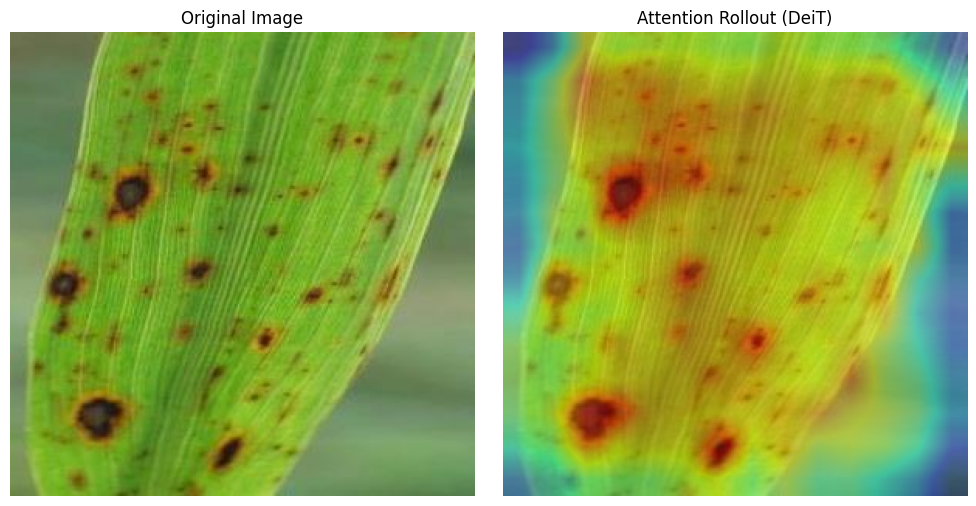

Tungro


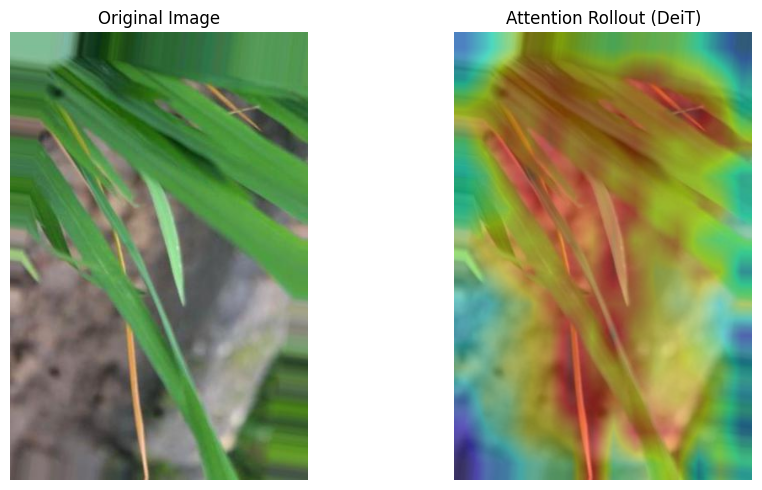

Leaf Smut


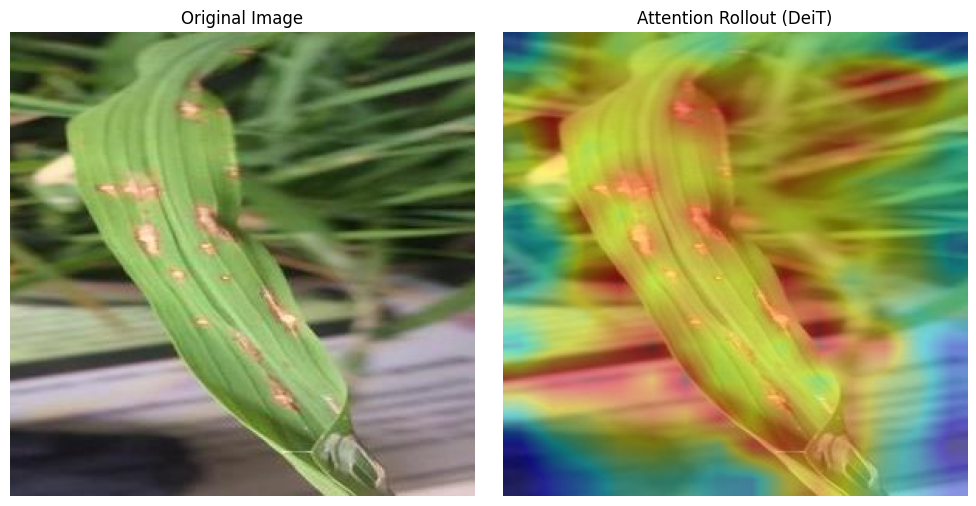

Leaf Blast


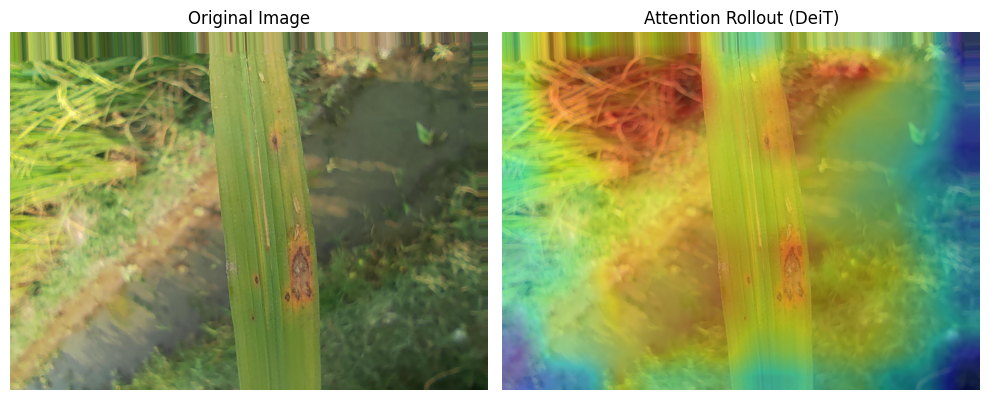

In [43]:

for name,image in image_paths.items():
    print(name)
    get_deit_attention_rollout(deit_model, image, transform, device)

    


`BeitSdpaSelfAttention` is used but `torch.nn.functional.scaled_dot_product_attention` does not support `output_attentions=True` or `head_mask`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


Brown Spot


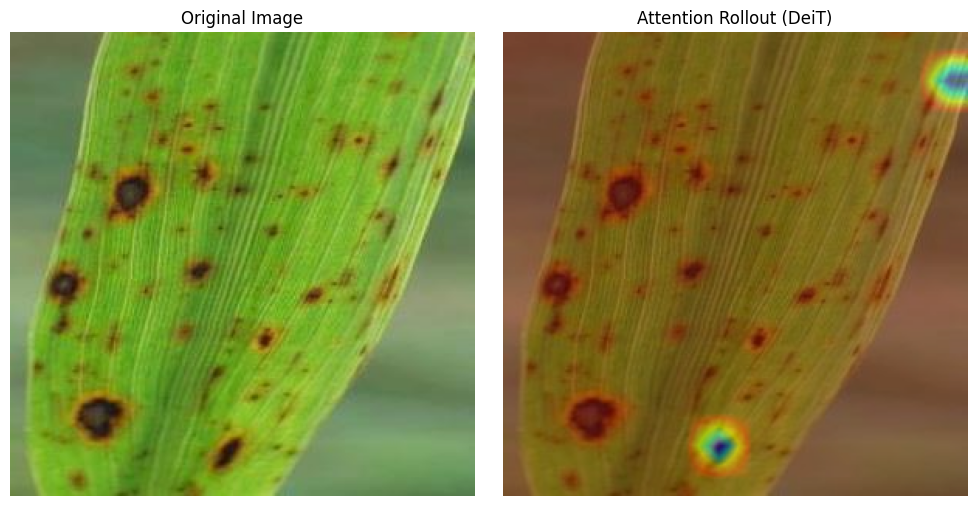

Tungro


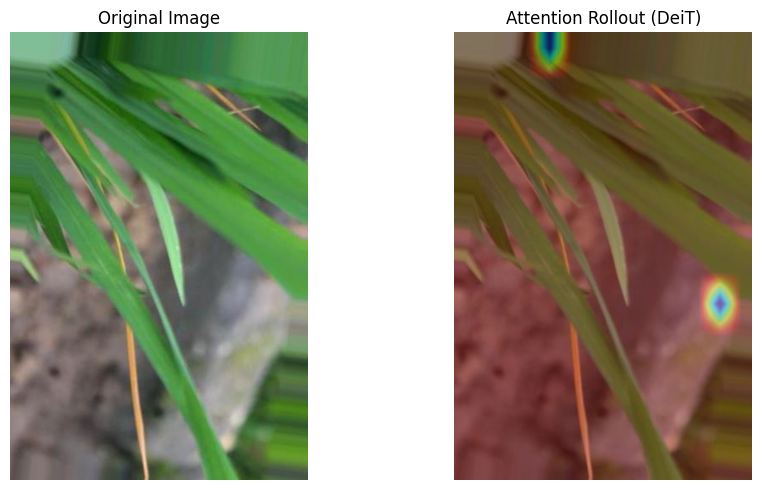

Leaf Smut


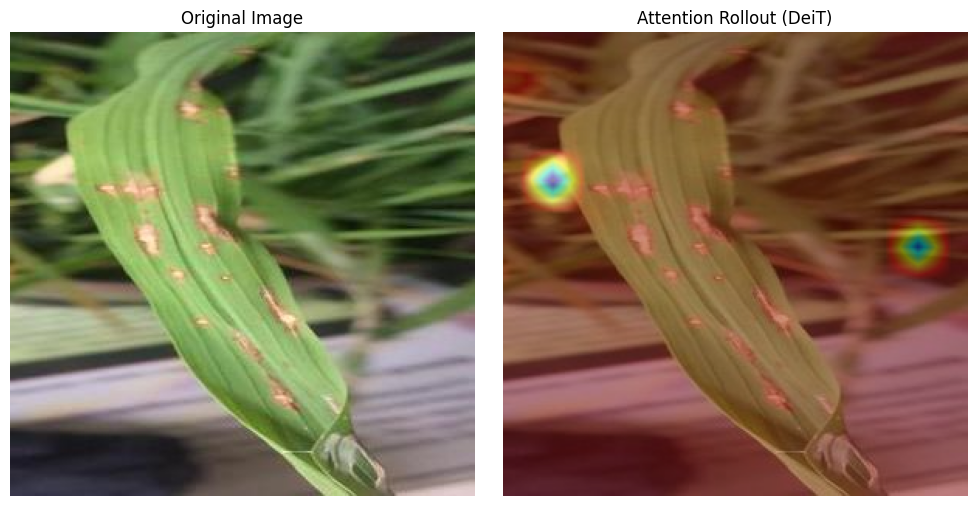

Leaf Blast


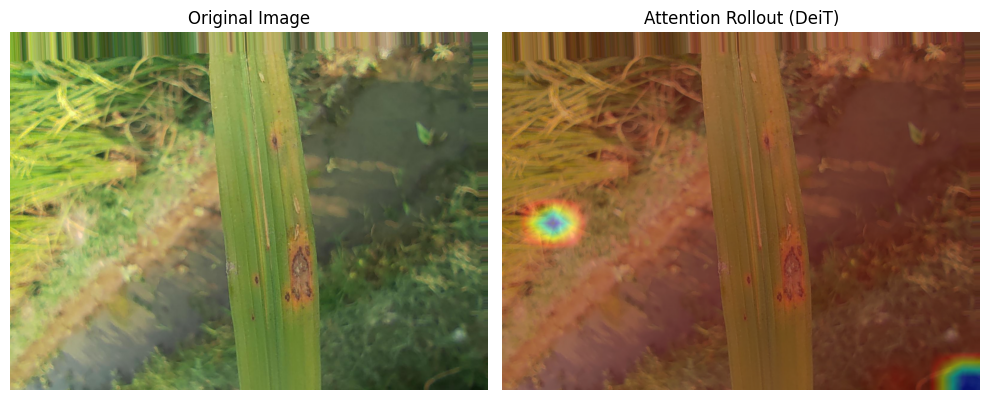

In [44]:
for name,image in image_paths.items():
    print(name)
    get_deit_attention_rollout(beit_model, image, transform, device,model_name="beit")


### GradCame for Swin Transformer

In [45]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
from torchvision.transforms.functional import to_pil_image
from PIL import Image
import cv2

def swin_gradcam(model, image_path, transform, device):
    model.eval()
    model.to(device)

    # Load and preprocess image
    image = Image.open(image_path).convert('RGB')
    input_tensor = transform(image).unsqueeze(0).to(device)

    # Hooks
    activations = []
    gradients = []

    def forward_hook(module, input, output):
        if isinstance(output, tuple):
            activations.append(output[0])
        else:
            activations.append(output)

    def backward_hook(module, grad_in, grad_out):
        gradients.append(grad_out[0])

    # Select a deep Swin block layer
    target_block = model.swin.encoder.layers[-1].blocks[-1]
    forward_handle = target_block.register_forward_hook(forward_hook)
    backward_handle = target_block.register_full_backward_hook(backward_hook)

    # Forward + backward
    output = model(input_tensor)
    class_idx = output.logits.argmax(dim=1).item()
    model.zero_grad()
    output.logits[0, class_idx].backward()

    # Remove hooks
    forward_handle.remove()
    backward_handle.remove()

    # Extract gradients and activations
    grads_val = gradients[0]  # (1, N, C)
    acts_val = activations[0]  # (1, N, C)

    if grads_val.dim() == 3:
        grads_val = grads_val.squeeze(0)  # (N, C)
        acts_val = acts_val.squeeze(0)    # (N, C)
    elif grads_val.dim() == 2:
        pass  # Already (N, C)
    else:
        raise ValueError("Unexpected grads/acts shape")

    # Global Average Pooling on gradients: shape (C,)
    weights = grads_val.mean(dim=0)

    # Weighted sum of activations
    cam = torch.matmul(acts_val, weights)  # (N,)

    grid_size = int(cam.shape[0] ** 0.5)
    cam = cam.reshape(grid_size, grid_size).cpu().detach().numpy()

    # Normalize CAM
    cam = (cam - cam.min()) / (cam.max() - cam.min())

    # Resize CAM to image size (correct shape: width x height)
    cam = cv2.resize(cam, (image.size[0], image.size[1]))  # (width, height)
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255

    # Make sure original image is the same shape as heatmap
    img_np = np.array(image).astype(np.float32) / 255
    if heatmap.shape != img_np.shape:
        heatmap = cv2.resize(heatmap, (img_np.shape[1], img_np.shape[0]))  # Ensure match

    overlay = 0.5 * heatmap + 0.5 * img_np
    overlay = np.clip(overlay, 0, 1)

    # Show results
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.title("Original")
    plt.imshow(image)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Grad-CAM")
    plt.imshow(cam, cmap='jet')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Overlay")
    plt.imshow(overlay)
    plt.axis('off')

    plt.tight_layout()
    plt.show()


Brown Spot


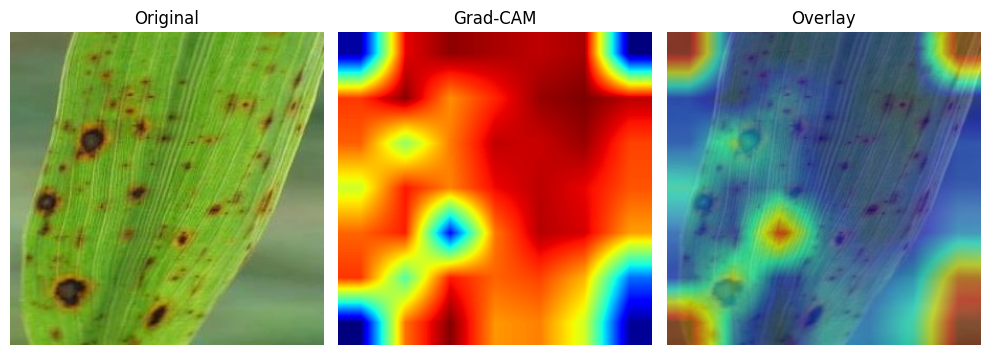

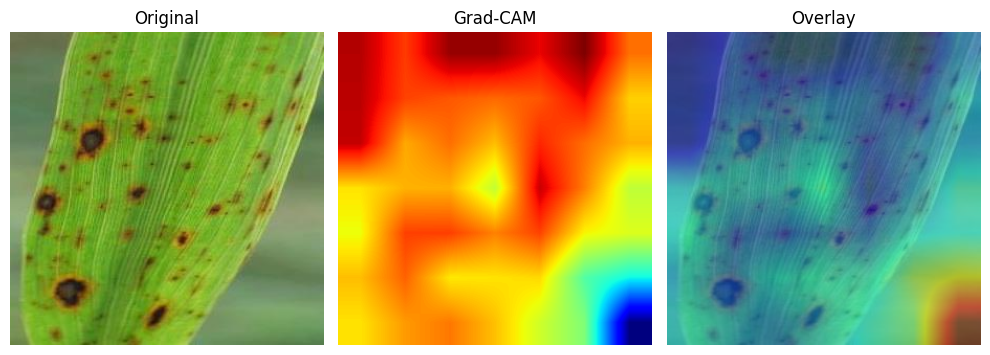

Brown Spot  SWIN TINY MODEL : 
Tungro


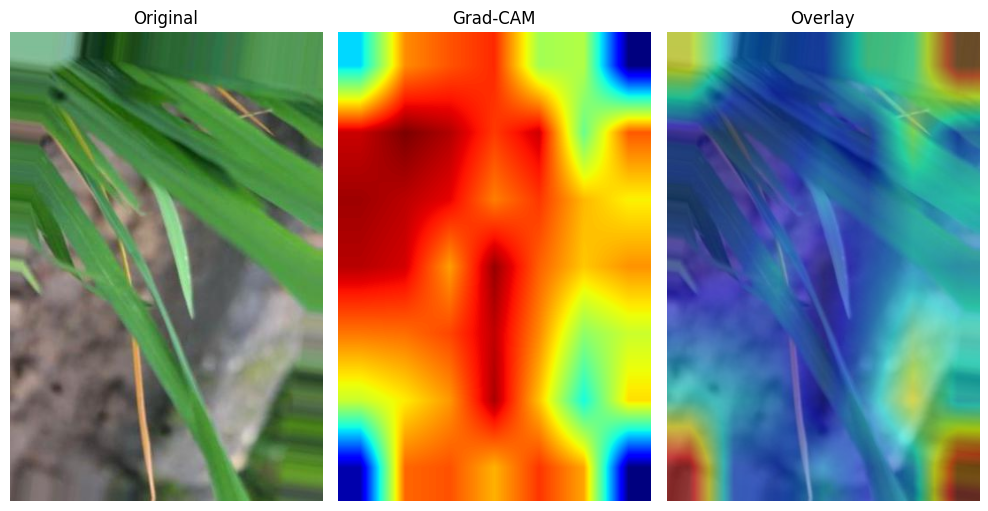

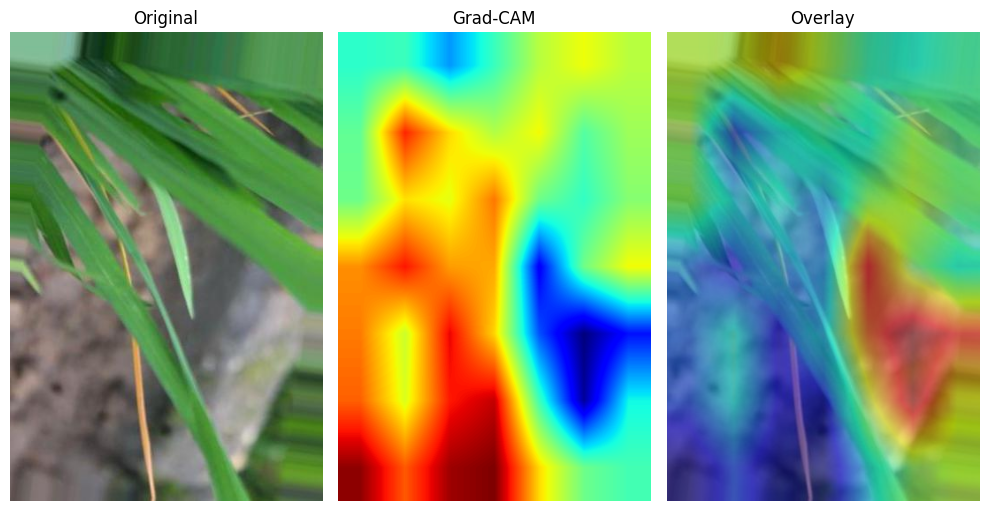

Tungro  SWIN TINY MODEL : 
Leaf Smut


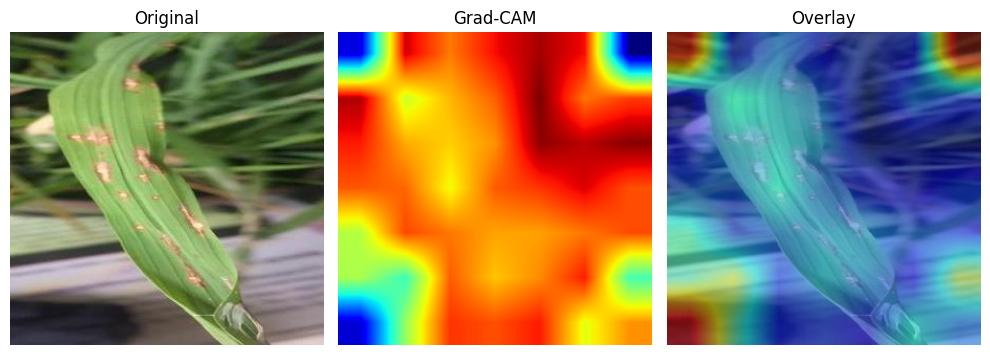

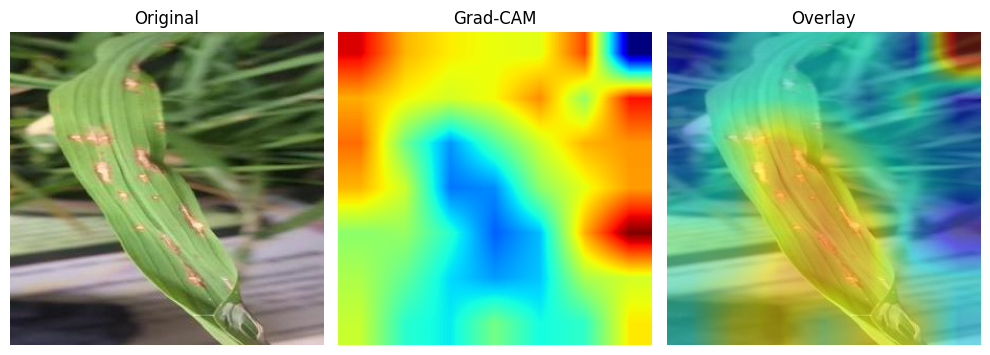

Leaf Smut  SWIN TINY MODEL : 
Leaf Blast


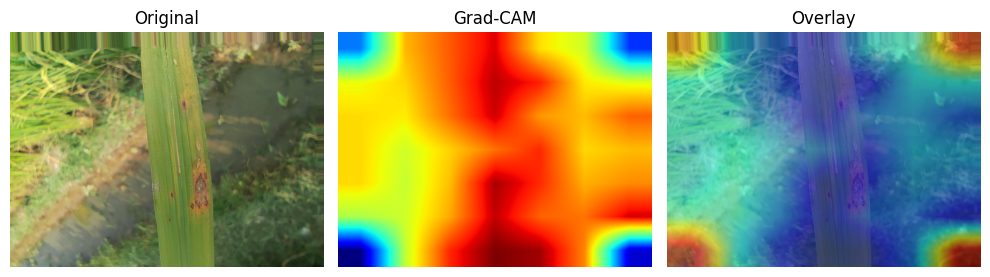

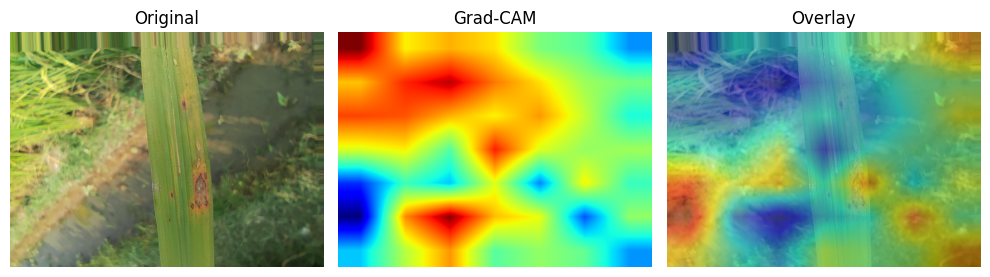

Leaf Blast  SWIN TINY MODEL : 


In [46]:
image_path = "./rice leaf diseases dataset/Brownspot/Brownspot (2).jpg"
image_paths = {
    "Brown Spot":"./rice leaf diseases dataset/Brownspot/Brownspot (2).jpg",
    "Tungro":"./rice leaf diseases dataset/tungro/tungro12.jpg",
    "Leaf Smut":"./rice leaf diseases dataset/Leafsmut/Leafsmut (43).JPG",
    "Leaf Blast":"./rice leaf diseases dataset/leaf_blast/leaf_blast5.jpg"
}
for name,image in image_paths.items():
    print(name)
    swin_gradcam(swin_model, image, transform, device)
    swin_gradcam(swin_tiny_model, image, transform, device)
    print(name," SWIN TINY MODEL : ")

### Quantization 

In [49]:


models = {
    "deit":deit_model,
    "beit":beit_model,
    "swin":swin_model,
    "swin_tiny":swin_tiny_model
}
# Quantize model
for name,trained_model in models.items():
    print("\n\n\n")
    print(f"RESULT AFTER QUANTIZATION : {name} model  _______________")
    
    model = quantize_model(trained_model)
    size_after = get_model_size(model)
    print(f"Model size after quantization: {size_after:.2f} MB")
    
    # Measure inference time
    sample_input = torch.randn(1, 3, 224, 224).to(device)
    avg_inference_time = measure_inference_time(model, sample_input)
    print(f"Average inference time: {avg_inference_time:.6f} seconds")
    
    # Evaluate accuracy after quantization
    quantized_val_accuracy = calculate_accuracy(model, val_loader)
    print(f"Validation Accuracy after quantization: {quantized_val_accuracy:.4f}")
    print(f"END  QUANTIZATION : {name}_______________")
    print("\n\n\n")







RESULT AFTER QUANTIZATION : deit model  _______________
Model size after quantization: 84.44 MB
Average inference time: 0.039316 seconds
Validation Accuracy after quantization: 0.9758
END  QUANTIZATION : deit_______________








RESULT AFTER QUANTIZATION : beit model  _______________
Model size after quantization: 84.30 MB
Average inference time: 0.045113 seconds
Validation Accuracy after quantization: 0.3297
END  QUANTIZATION : beit_______________








RESULT AFTER QUANTIZATION : swin model  _______________
Model size after quantization: 84.14 MB
Average inference time: 0.072753 seconds
Validation Accuracy after quantization: 0.9975
END  QUANTIZATION : swin_______________








RESULT AFTER QUANTIZATION : swin_tiny model  _______________
Model size after quantization: 26.89 MB
Average inference time: 0.033626 seconds
Validation Accuracy after quantization: 0.9956
END  QUANTIZATION : swin_tiny_______________






In [50]:
# from torchvision.transforms import Compose, Resize, ToTensor, Normalize
# from torchcam.methods import SmoothGradCAMpp
# from torchcam.utils import overlay_mask
# from torchvision.transforms.functional import to_pil_image
# from PIL import Image
# import matplotlib.pyplot as plt
# import numpy as np

# # --- Grad-CAM for DeiT ---
# def apply_gradcam_deit_tensor(model, input_tensor, class_names=None,
#                               target_layer='hf_model.deit.encoder.layer.11.output.dense'):
#     model.eval()
#     wrapped_model = LogitsWrapper(model)

#     # Show available layers
#     # print("🔍 Available layers inside wrapped DeiT model:\n")
#     # for name, _ in wrapped_model.named_modules():
#     #     print(name)

#     # Use corrected target_layer
#     cam_extractor = SmoothGradCAMpp(wrapped_model, target_layer=None)

#     # Ensure tensor is batched and on device
#     input_tensor = input_tensor.unsqueeze(0).to(device)

#     # Forward pass
#     logits = wrapped_model(input_tensor)
#     pred_class = logits.argmax(dim=1).item()

#     # Extract CAM
#     activation_map = cam_extractor(pred_class, logits)[0].cpu()

#     # De-normalize and convert image
#     inv_normalize = Normalize(mean=[-1, -1, -1], std=[1/0.5]*3)
#     img = inv_normalize(input_tensor.squeeze().cpu())
#     img_pil = to_pil_image(img)

#     # Overlay CAM
#     result = overlay_mask(img_pil, to_pil_image(activation_map, mode='F'), alpha=0.5)

#     # Display
#     class_name = class_names[pred_class] if class_names else f"class {pred_class}"
#     plt.imshow(result)
#     plt.title(f"Grad-CAM - {class_name}")
#     plt.axis("off")
#     plt.show()



Confusion Matrix [[481   0   0   0   0   0   0   0   0   0   0]
 [  0 486   0   0   0   0   0   0   0   0   0]
 [  0   0 603   0   1   0   0   0   0   0   0]
 [  0   0   0 439   0   0   0   0   0   0   0]
 [  0   0   5   0 532   2   2   0   0   1   0]
 [  0   0   0   0   0 501   0   0   0   0   0]
 [  0   0   0   0   4   5 412   0   0   4   0]
 [  0   0   0   0   0   0   0 300   0   0   0]
 [  0   0   0   0   0   0   0   0 438   0   0]
 [  0   0   0   0   0   0   0   0   0 474   0]
 [  0   0   0   0   0   0   0   0   0   0 524]]


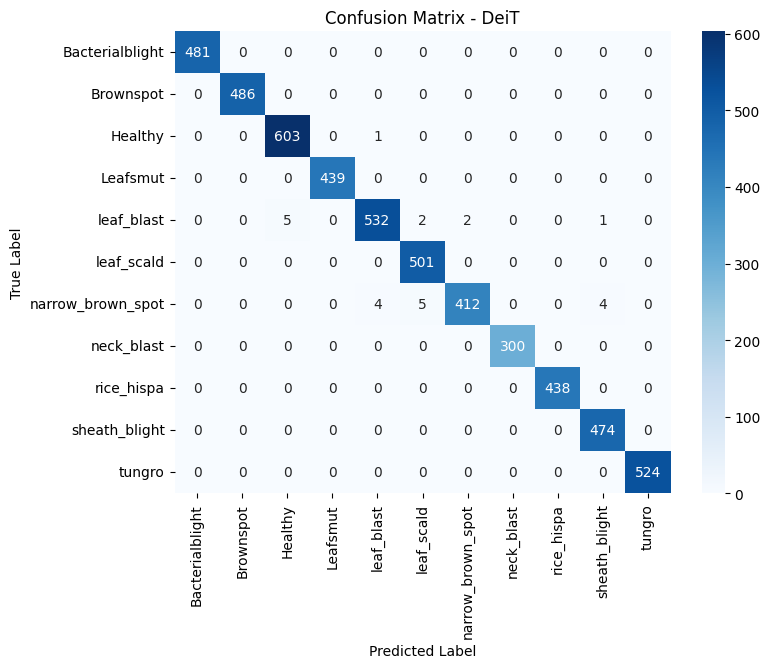

Confusion Matrix [[481   0   0   0   0   0   0   0   0   0   0]
 [  0 486   0   0   0   0   0   0   0   0   0]
 [  0   0 593   0  10   0   0   0   1   0   0]
 [  0   0   0 439   0   0   0   0   0   0   0]
 [  0   0   6   0 534   1   1   0   0   0   0]
 [  0   0   0   0   3 497   0   0   0   1   0]
 [  0   0   0   0  35   8 377   0   0   3   2]
 [  0   0   0   0   0   0   0 300   0   0   0]
 [  0   0   0   0   0   0   0   0 438   0   0]
 [  0   0   0   0   0   0   2   0   0 472   0]
 [  0   0   0   0   0   0   0   0   0   0 524]]


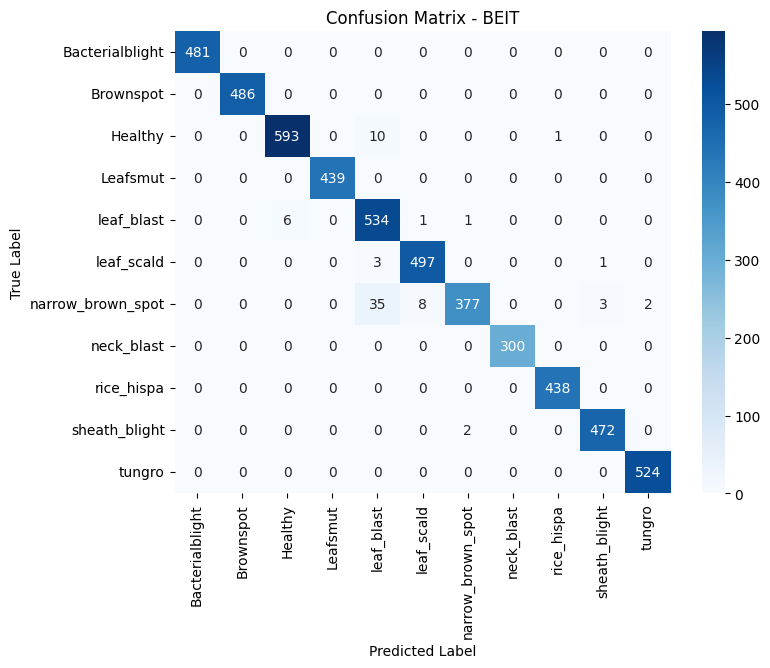

Confusion Matrix [[481   0   0   0   0   0   0   0   0   0   0]
 [  0 486   0   0   0   0   0   0   0   0   0]
 [  0   0 603   0   0   0   0   0   0   1   0]
 [  0   0   0 439   0   0   0   0   0   0   0]
 [  0   0   2   0 533   2   4   0   0   1   0]
 [  0   0   0   0   0 500   1   0   0   0   0]
 [  0   0   0   0   2   1 422   0   0   0   0]
 [  0   0   0   0   0   0   0 300   0   0   0]
 [  0   0   0   0   0   0   0   0 438   0   0]
 [  0   0   0   0   0   0   0   0   0 474   0]
 [  0   0   0   0   0   0   0   0   0   0 524]]


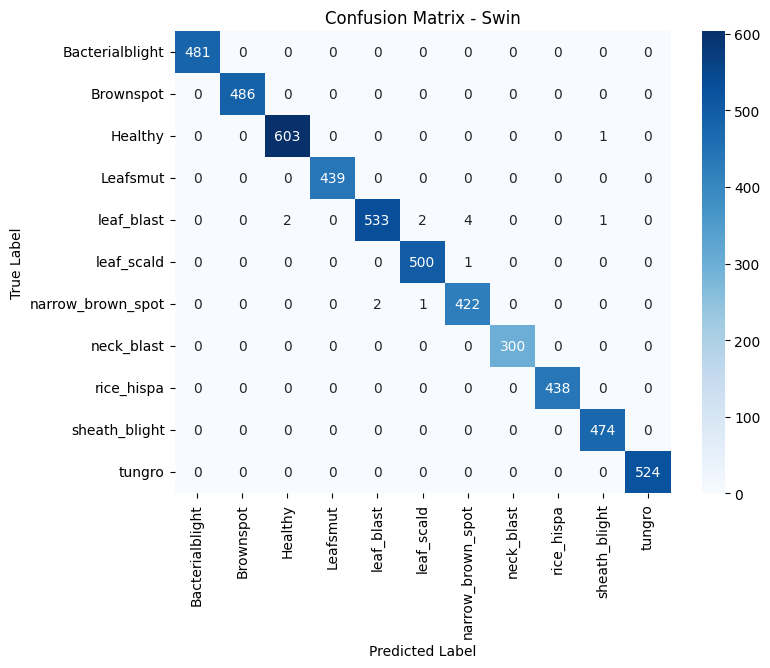

Confusion Matrix [[481   0   0   0   0   0   0   0   0   0   0]
 [  0 486   0   0   0   0   0   0   0   0   0]
 [  0   0 603   0   0   0   0   0   1   0   0]
 [  0   0   0 439   0   0   0   0   0   0   0]
 [  0   0   1   0 531   2   7   0   0   1   0]
 [  0   0   0   0   1 498   0   0   0   2   0]
 [  0   0   0   0   2   3 420   0   0   0   0]
 [  0   0   0   0   0   0   0 300   0   0   0]
 [  0   0   0   0   0   0   0   0 438   0   0]
 [  0   0   0   0   0   0   1   0   0 473   0]
 [  0   0   0   0   0   0   0   0   0   0 524]]


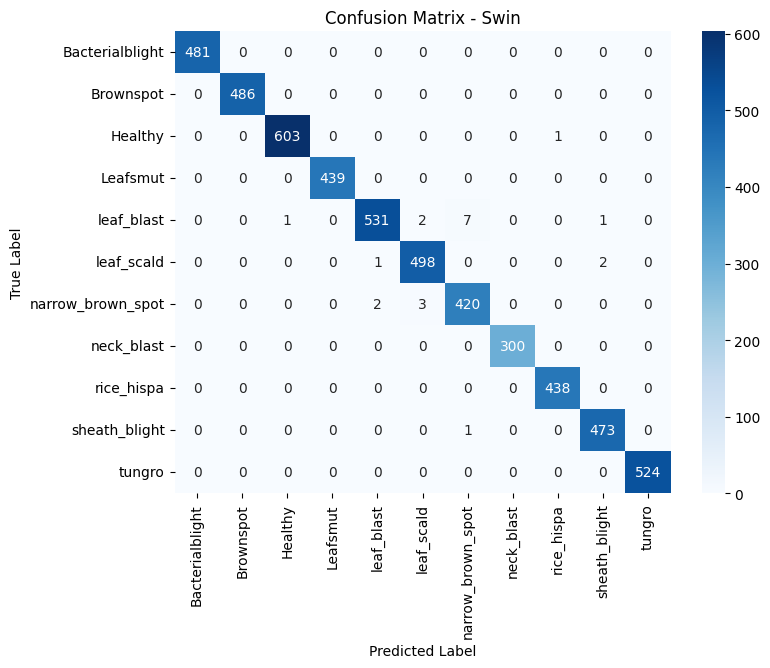

In [51]:
y_true, y_pred = get_all_predictions(deit_model, val_loader)
plot_confusion_matrix(y_true, y_pred, model_name="DeiT")

y_true, y_pred = get_all_predictions(beit_model, val_loader)
plot_confusion_matrix(y_true, y_pred, model_name="BEIT")

y_true, y_pred = get_all_predictions(swin_model, val_loader)
plot_confusion_matrix(y_true, y_pred, model_name="Swin")

y_true, y_pred = get_all_predictions(swin_tiny_model, val_loader)
plot_confusion_matrix(y_true, y_pred, model_name="Swin")

In [52]:
from sklearn.metrics import f1_score, precision_score, recall_score

def evaluate_model(y_true, y_pred, model_name="Model"):
    f1 = f1_score(y_true, y_pred, average='weighted')
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    
    print(f"{model_name} Evaluation:")
    print(f"F1 Score: {f1:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print("-" * 30)

Confusion Matrix [[481   0   0   0   0   0   0   0   0   0   0]
 [  0 486   0   0   0   0   0   0   0   0   0]
 [  0   0 603   0   1   0   0   0   0   0   0]
 [  0   0   0 439   0   0   0   0   0   0   0]
 [  0   0   5   0 532   2   2   0   0   1   0]
 [  0   0   0   0   0 501   0   0   0   0   0]
 [  0   0   0   0   4   5 412   0   0   4   0]
 [  0   0   0   0   0   0   0 300   0   0   0]
 [  0   0   0   0   0   0   0   0 438   0   0]
 [  0   0   0   0   0   0   0   0   0 474   0]
 [  0   0   0   0   0   0   0   0   0   0 524]]


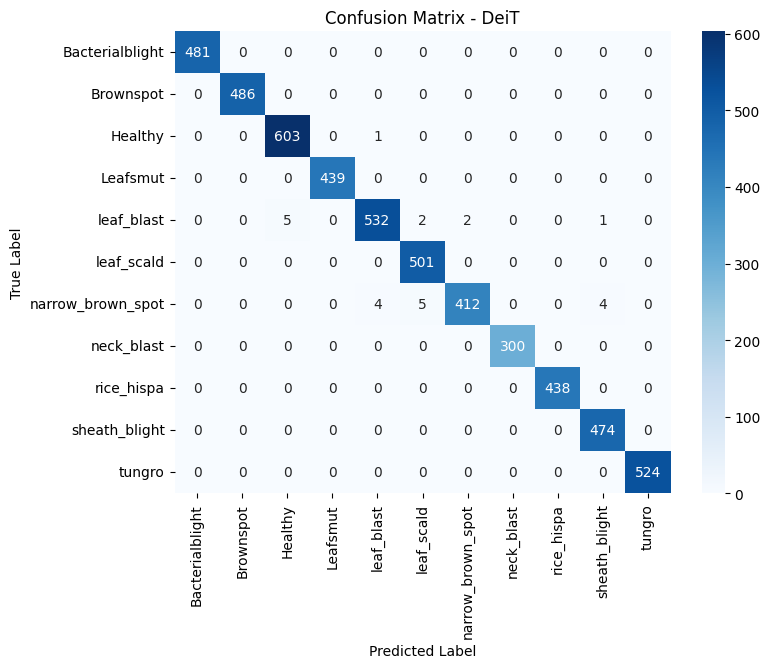

DeiT Evaluation:
F1 Score: 0.9954
Precision: 0.9954
Recall: 0.9954
------------------------------
Confusion Matrix [[481   0   0   0   0   0   0   0   0   0   0]
 [  0 486   0   0   0   0   0   0   0   0   0]
 [  0   0 593   0  10   0   0   0   1   0   0]
 [  0   0   0 439   0   0   0   0   0   0   0]
 [  0   0   6   0 534   1   1   0   0   0   0]
 [  0   0   0   0   3 497   0   0   0   1   0]
 [  0   0   0   0  35   8 377   0   0   3   2]
 [  0   0   0   0   0   0   0 300   0   0   0]
 [  0   0   0   0   0   0   0   0 438   0   0]
 [  0   0   0   0   0   0   2   0   0 472   0]
 [  0   0   0   0   0   0   0   0   0   0 524]]


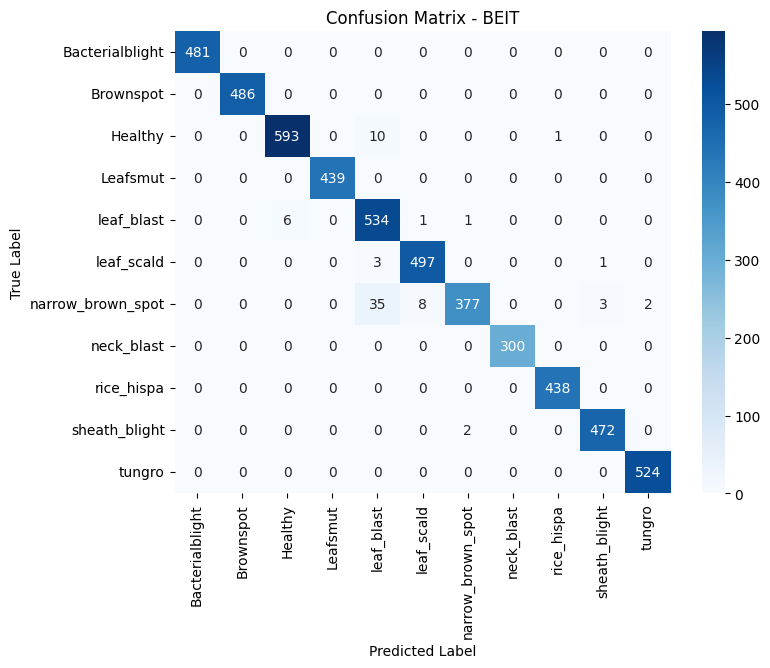

BEIT Evaluation:
F1 Score: 0.9859
Precision: 0.9866
Recall: 0.9860
------------------------------
Confusion Matrix [[481   0   0   0   0   0   0   0   0   0   0]
 [  0 486   0   0   0   0   0   0   0   0   0]
 [  0   0 603   0   0   0   0   0   0   1   0]
 [  0   0   0 439   0   0   0   0   0   0   0]
 [  0   0   2   0 533   2   4   0   0   1   0]
 [  0   0   0   0   0 500   1   0   0   0   0]
 [  0   0   0   0   2   1 422   0   0   0   0]
 [  0   0   0   0   0   0   0 300   0   0   0]
 [  0   0   0   0   0   0   0   0 438   0   0]
 [  0   0   0   0   0   0   0   0   0 474   0]
 [  0   0   0   0   0   0   0   0   0   0 524]]


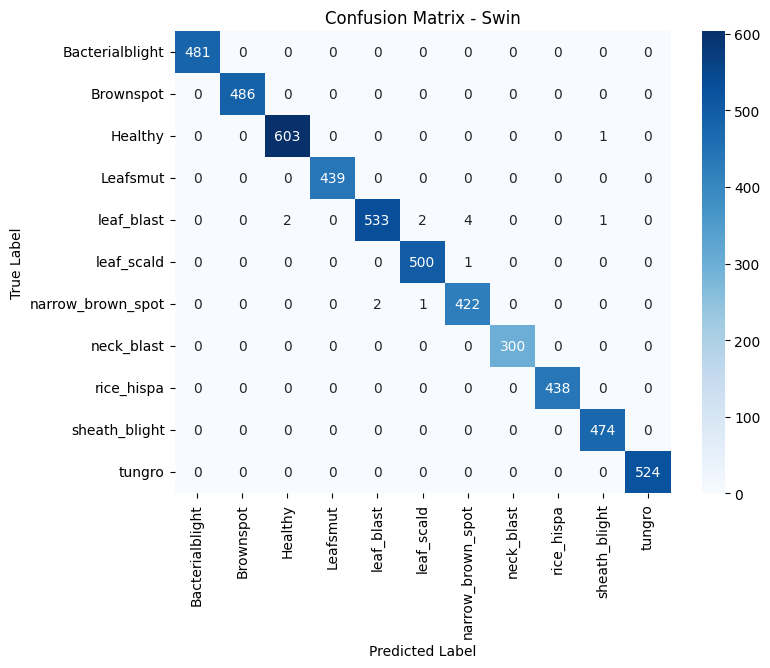

Swin Evaluation:
F1 Score: 0.9973
Precision: 0.9973
Recall: 0.9973
------------------------------
Confusion Matrix [[481   0   0   0   0   0   0   0   0   0   0]
 [  0 486   0   0   0   0   0   0   0   0   0]
 [  0   0 603   0   0   0   0   0   1   0   0]
 [  0   0   0 439   0   0   0   0   0   0   0]
 [  0   0   1   0 531   2   7   0   0   1   0]
 [  0   0   0   0   1 498   0   0   0   2   0]
 [  0   0   0   0   2   3 420   0   0   0   0]
 [  0   0   0   0   0   0   0 300   0   0   0]
 [  0   0   0   0   0   0   0   0 438   0   0]
 [  0   0   0   0   0   0   1   0   0 473   0]
 [  0   0   0   0   0   0   0   0   0   0 524]]


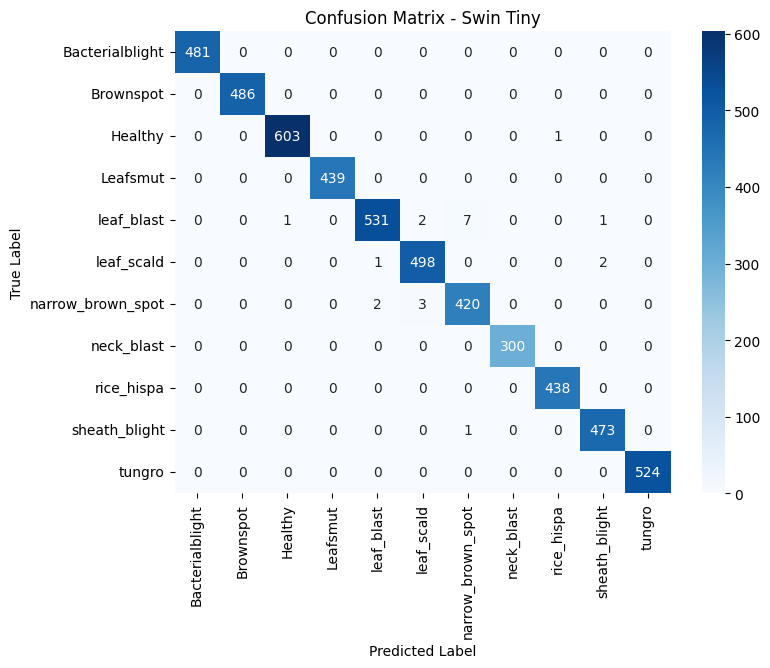

Swin Tiny Evaluation:
F1 Score: 0.9960
Precision: 0.9960
Recall: 0.9960
------------------------------


In [53]:
# DeiT
y_true, y_pred = get_all_predictions(deit_model, val_loader)
plot_confusion_matrix(y_true, y_pred, model_name="DeiT")
evaluate_model(y_true, y_pred, model_name="DeiT")

# BEIT
y_true, y_pred = get_all_predictions(beit_model, val_loader)
plot_confusion_matrix(y_true, y_pred, model_name="BEIT")
evaluate_model(y_true, y_pred, model_name="BEIT")

# Swin (Base or Large)
y_true, y_pred = get_all_predictions(swin_model, val_loader)
plot_confusion_matrix(y_true, y_pred, model_name="Swin")
evaluate_model(y_true, y_pred, model_name="Swin")

# Swin Tiny
y_true, y_pred = get_all_predictions(swin_tiny_model, val_loader)
plot_confusion_matrix(y_true, y_pred, model_name="Swin Tiny")
evaluate_model(y_true, y_pred, model_name="Swin Tiny")

In [54]:
# class LogitsWrapper(nn.Module):
#     def __init__(self, hf_model):
#         super().__init__()
#         self.hf_model = hf_model

#     def forward(self, x):
#         if isinstance(x, dict):
#             return self.hf_model(**x).logits
#         else:
#             return self.hf_model(pixel_values=x).logits


In [55]:
# def print_model_layers(model):
#     print("🔍 Model submodules:")
#     for name, module in model.named_modules():
#         print(name)

# print_model_layers(deit_model)

In [56]:

# # Put models in evaluation mode
# deit_model.eval()
# # beit_model.eval()
# # swin_model.eval()

# # Collect some validation samples
# def get_samples(val_loader, num_samples=3):
#     data_iter = iter(val_loader)
#     images, labels = next(data_iter)
#     return images[:num_samples].to(device)

# # Get samples
# sample_images = get_samples(val_loader)

# # Create models dictionary
# models = {
#     "deit": deit_model,
#     # "beit": beit_model, 
#     # "swin": swin_model
# }

# # # First debug model structures
# # for model_name, model in models.items():
# #     debug_transformer_model(model, model_name)

# # # Then run Grad-CAM
# # run_gradcam_for_models(models, sample_images, class_names)

# # --- Example Loop ---
# sample_images = get_samples(val_loader, num_samples=3)

# for i, image in enumerate(sample_images):
#     print(f"🔍 Grad-CAM for sample {i+1}")
#     apply_gradcam_deit_tensor(deit_model, image, class_names=class_names)


# TEST Model Shrinkage

In [57]:
# Install the TensorFlow Model Optimization Toolkit
!pip install -q tensorflow-model-optimization


[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [58]:
import gc
# Import necessary libraries
import tensorflow as tf
import tempfile
import os
import time
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications import VGG16, MobileNetV2, EfficientNetB0, ResNet50
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l2

gc.collect()
tf.keras.backend.clear_session()

BATCH_SIZE = 64
IMG_SIZE = (224, 224)  # Standard for pre-trained models
EPOCHS = 100
NUM_CLASSES =11




In [59]:
# Function to create model
def create_model(base_model, name=None):
    # if name == "ResNet50":
    #     for layer in base_model.layers:
    #         layer.trainable = False
    # else:
    base_model.trainable = False

    x = base_model.output
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dense(128, activation='relu', kernel_regularizer=l2(0.001))(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    
    if name == "MobileNetV2":

        # layer.trainable = False
        # Extra layers for MobileNetV2
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Dense(1028, activation='relu', kernel_regularizer=l2(0.01))(x)
        x = tf.keras.layers.Dropout(0.4)(x)

        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Dense(512, activation='relu', kernel_regularizer=l2(0.01))(x)
        x = tf.keras.layers.Dropout(0.3)(x)

        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Dense(128, activation='relu', kernel_regularizer=l2(0.01))(x)
        x = tf.keras.layers.Dropout(0.2)(x)

        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Dense(64, activation='relu', kernel_regularizer=l2(0.001))(x)
        # x = tf.keras.layers.Dropout(0.1)(x)

        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Dense(32, activation='relu', kernel_regularizer=l2(0.001))(x)
        # x = tf.keras.layers.Dropout(0.1)(x)

        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Dense(16, activation='relu', kernel_regularizer=l2(0.001))(x)
        # x = tf.keras.layers.Dropout(0.1)(x)

    predictions = tf.keras.layers.Dense(NUM_CLASSES, activation='softmax')(x)
    model = tf.keras.models.Model(inputs=base_model.input, outputs=predictions)
    return model

# Quantization function (post-training quantization)
def apply_quantization(model):
    # Convert model to TensorFlow Lite model
    converter = tf.lite.TFLiteConverter.from_keras_model(model)
    # Apply quantization
    converter.optimizations = [tf.lite.Optimize.DEFAULT]
    quantized_model = converter.convert()
    return quantized_model

def apply_float16_quantization(model):
    converter = tf.lite.TFLiteConverter.from_keras_model(model)
    converter.optimizations = [tf.lite.Optimize.DEFAULT]
    converter.target_spec.supported_types = [tf.float16]
    quantized_model = converter.convert()
    return quantized_model
# Function to evaluate TFLite model

def evaluate_tflite_model(tflite_model, dataset):
    interpreter = tf.lite.Interpreter(model_content=tflite_model)
    interpreter.allocate_tensors()
    
    input_index = interpreter.get_input_details()[0]["index"]
    output_index = interpreter.get_output_details()[0]["index"]
    
    predictions = []
    test_labels = []
    
    for images, labels in dataset:
        for img, label in zip(images.numpy(), labels.numpy()):
            # Preprocess the image to required size and cast
            img = np.expand_dims(img, axis=0).astype(np.float32)
            
            interpreter.set_tensor(input_index, img)
            interpreter.invoke()
            
            # Get the result and postprocess to get the predicted class
            output = interpreter.get_tensor(output_index)
            predictions.append(output[0])
            test_labels.append(label)
    
    predictions = np.array(predictions)
    test_labels = np.array(test_labels)
    predicted_classes = np.argmax(predictions, axis=1)
    
    # Calculate accuracy
    acc = np.sum(predicted_classes == test_labels) / len(test_labels)
    return acc, predictions


In [60]:




# List of pre-trained models
models = {
    # "VGG16": VGG16(weights='imagenet', include_top=False, input_shape=IMG_SIZE + (3,)),
    "MobileNetV2": MobileNetV2(weights='imagenet', include_top=False, input_shape=IMG_SIZE + (3,)),
    "EfficientNetB0": EfficientNetB0(weights='imagenet', include_top=False, input_shape=IMG_SIZE + (3,)),
    "ResNet50": ResNet50(weights='imagenet', include_top=False, input_shape=IMG_SIZE + (3,)),
}

# Dictionary to store performance metrics
performance_metrics = {model_name: {
    "size": {},
    "inference_time": {},
    "accuracy": {}
} for model_name in models}

# Dictionary to store history for plotting
history_dict = {}


--------------------------------------------------
Optimizing model: MobileNetV2
--------------------------------------------------
Creating and training original model...
Epoch 1/50
95/95 ━━━━━━━━━━━━━━━━━━━━ 119s 1s/step - accuracy: 0.2277 - loss: 12.5245 - val_accuracy: 0.6209 - val_loss: 7.6979
Epoch 2/50
95/95 ━━━━━━━━━━━━━━━━━━━━ 113s 1s/step - accuracy: 0.6551 - loss: 6.2208 - val_accuracy: 0.7894 - val_loss: 3.5406
Epoch 3/50
95/95 ━━━━━━━━━━━━━━━━━━━━ 113s 1s/step - accuracy: 0.7739 - loss: 2.9826 - val_accuracy: 0.8653 - val_loss: 1.9267
Epoch 4/50
95/95 ━━━━━━━━━━━━━━━━━━━━ 113s 1s/step - accuracy: 0.8260 - loss: 1.7791 - val_accuracy: 0.8940 - val_loss: 1.2960
Epoch 5/50
95/95 ━━━━━━━━━━━━━━━━━━━━ 114s 1s/step - accuracy: 0.8573 - loss: 1.3054 - val_accuracy: 0.9155 - val_loss: 1.0104
Epoch 6/50
95/95 ━━━━━━━━━━━━━━━━━━━━ 113s 1s/step - accuracy: 0.8724 - loss: 1.1169 - val_accuracy: 0.9198 - val_loss: 0.8944
Epoch 7/50
95/95 ━━━━━━━━━━━━━━━━━━━━ 113s 1s/step - accuracy: 0

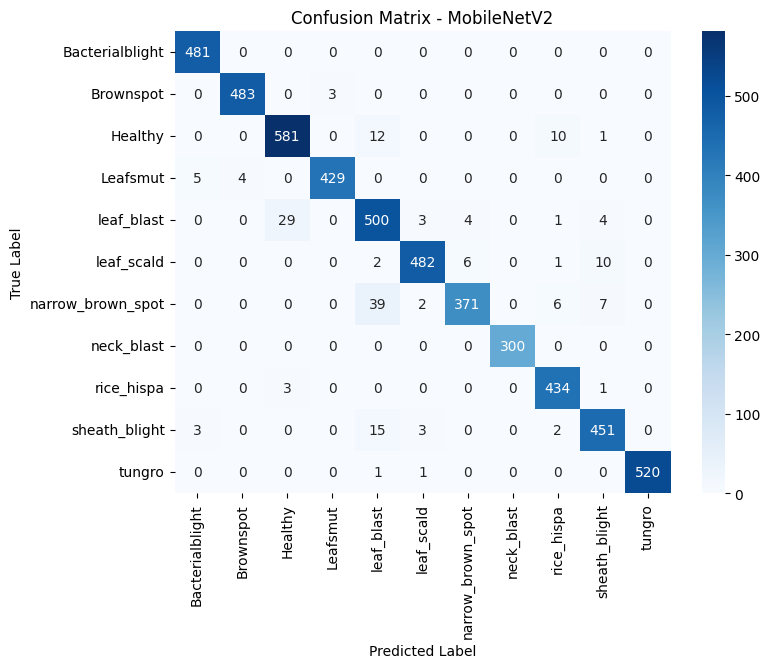

MobileNetV2 Evaluation:
F1 Score: 0.9658
Precision: 0.9665
Recall: 0.9658
------------------------------
41/41 ━━━━━━━━━━━━━━━━━━━━ 34s 816ms/step - accuracy: 0.9619 - loss: 0.5749
Original model - Size: 19.61 MB, Accuracy: 0.9658, Inference time: 820.70 ms per batch

Applying weight clustering...
95/95 ━━━━━━━━━━━━━━━━━━━━ 118s 1s/step - accuracy: 0.5861 - loss: 1.6178 - val_accuracy: 0.8733 - val_loss: 0.6425


41/41 ━━━━━━━━━━━━━━━━━━━━ 34s 833ms/step - accuracy: 0.8689 - loss: 0.6519
Clustered model - Size: 11.07 MB, Accuracy: 0.8733, Inference time: 837.99 ms per batch

Applying quantization...
INFO:tensorflow:Assets written to: C:\Users\MSC04\AppData\Local\Temp\tmpdwld5fdl\assets


INFO:tensorflow:Assets written to: C:\Users\MSC04\AppData\Local\Temp\tmpdwld5fdl\assets


Saved artifact at 'C:\Users\MSC04\AppData\Local\Temp\tmpdwld5fdl'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 11), dtype=tf.float32, name=None)
Captures:
  1705860492352: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1705860489712: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1705860483728: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1705860481792: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1705860487424: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1705860487952: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1709090773424: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1705849193216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1705849195328: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1709090782400: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1705

C:\Users\MSC04\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow\lite\python\interpreter.py:457: UserWarning:     Warning: tf.lite.Interpreter is deprecated and is scheduled for deletion in
    TF 2.20. Please use the LiteRT interpreter from the ai_edge_litert package.
    See the [migration guide](https://ai.google.dev/edge/litert/migration)
    for details.
    
  warnings.warn(_INTERPRETER_DELETION_WARNING)


Quantized model - Size: 2.55 MB, Accuracy: 0.8633, Inference time: 3614.28 ms per batch

--------------------------------------------------
Optimizing model: EfficientNetB0
--------------------------------------------------
Creating and training original model...
Epoch 1/50
95/95 ━━━━━━━━━━━━━━━━━━━━ 154s 2s/step - accuracy: 0.1069 - loss: 2.8325 - val_accuracy: 0.1159 - val_loss: 2.6030
Epoch 2/50
95/95 ━━━━━━━━━━━━━━━━━━━━ 145s 2s/step - accuracy: 0.1194 - loss: 2.6360 - val_accuracy: 0.0977 - val_loss: 2.5878
Epoch 3/50
95/95 ━━━━━━━━━━━━━━━━━━━━ 145s 2s/step - accuracy: 0.1306 - loss: 2.5621 - val_accuracy: 0.1038 - val_loss: 2.5718
Epoch 4/50
95/95 ━━━━━━━━━━━━━━━━━━━━ 146s 2s/step - accuracy: 0.1400 - loss: 2.5184 - val_accuracy: 0.1236 - val_loss: 2.5491
Epoch 5/50
95/95 ━━━━━━━━━━━━━━━━━━━━ 146s 2s/step - accuracy: 0.1596 - loss: 2.4694 - val_accuracy: 0.1376 - val_loss: 2.5284
Epoch 6/50
95/95 ━━━━━━━━━━━━━━━━━━━━ 146s 2s/step - accuracy: 0.1596 - loss: 2.4367 - val_accuracy: 

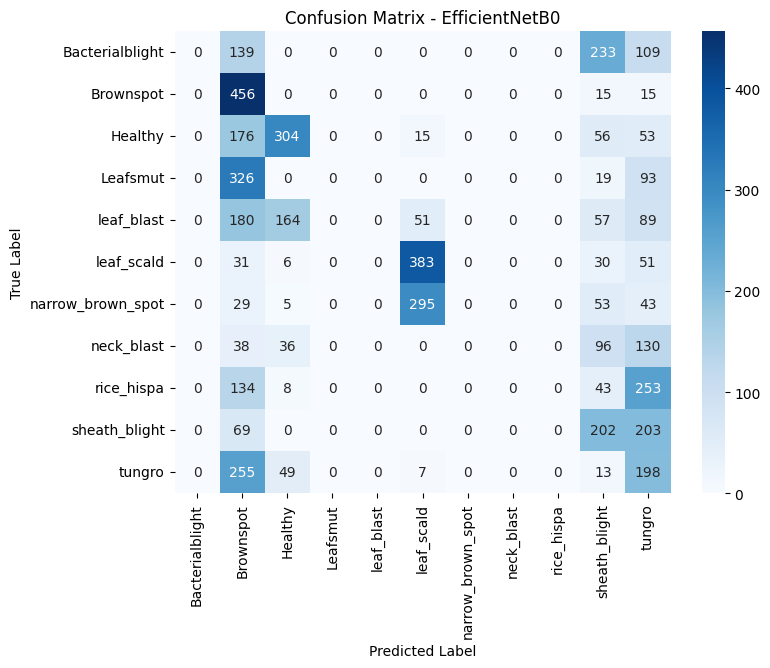

C:\Users\MSC04\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


EfficientNetB0 Evaluation:
F1 Score: 0.2065
Precision: 0.1724
Recall: 0.2962
------------------------------
41/41 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - accuracy: 0.3029 - loss: 2.1000
Original model - Size: 18.09 MB, Accuracy: 0.2962, Inference time: 1077.71 ms per batch

Applying weight clustering...
95/95 ━━━━━━━━━━━━━━━━━━━━ 175s 2s/step - accuracy: 0.0960 - loss: 2.8450 - val_accuracy: 0.0933 - val_loss: 2.6008


41/41 ━━━━━━━━━━━━━━━━━━━━ 47s 1s/step - accuracy: 0.0959 - loss: 2.6008
Clustered model - Size: 18.09 MB, Accuracy: 0.0933, Inference time: 1148.28 ms per batch

Applying quantization...
INFO:tensorflow:Assets written to: C:\Users\MSC04\AppData\Local\Temp\tmpl53k782i\assets


INFO:tensorflow:Assets written to: C:\Users\MSC04\AppData\Local\Temp\tmpl53k782i\assets


Saved artifact at 'C:\Users\MSC04\AppData\Local\Temp\tmpl53k782i'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_154')
Output Type:
  TensorSpec(shape=(None, 11), dtype=tf.float32, name=None)
Captures:
  1709027206672: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  1709027206848: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  1708848951040: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1708848893440: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1708848895904: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1708848891856: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1708848891504: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1708848903120: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1708848900656: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1708848899600: TensorSpec(shape=(), dtype=tf.resou

C:\Users\MSC04\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow\lite\python\interpreter.py:457: UserWarning:     Warning: tf.lite.Interpreter is deprecated and is scheduled for deletion in
    TF 2.20. Please use the LiteRT interpreter from the ai_edge_litert package.
    See the [migration guide](https://ai.google.dev/edge/litert/migration)
    for details.
    
  warnings.warn(_INTERPRETER_DELETION_WARNING)


Quantized model - Size: 4.49 MB, Accuracy: 0.1405, Inference time: 6014.83 ms per batch

--------------------------------------------------
Optimizing model: ResNet50
--------------------------------------------------
Creating and training original model...
Epoch 1/50
95/95 ━━━━━━━━━━━━━━━━━━━━ 300s 3s/step - accuracy: 0.3546 - loss: 2.0742 - val_accuracy: 0.0952 - val_loss: 2.7738
Epoch 2/50
95/95 ━━━━━━━━━━━━━━━━━━━━ 276s 3s/step - accuracy: 0.5173 - loss: 1.5166 - val_accuracy: 0.2215 - val_loss: 2.4662
Epoch 3/50
95/95 ━━━━━━━━━━━━━━━━━━━━ 275s 3s/step - accuracy: 0.5667 - loss: 1.3583 - val_accuracy: 0.3432 - val_loss: 2.0094
Epoch 4/50
95/95 ━━━━━━━━━━━━━━━━━━━━ 276s 3s/step - accuracy: 0.5927 - loss: 1.2642 - val_accuracy: 0.5163 - val_loss: 1.6147
Epoch 5/50
95/95 ━━━━━━━━━━━━━━━━━━━━ 274s 3s/step - accuracy: 0.6128 - loss: 1.2030 - val_accuracy: 0.6457 - val_loss: 1.3100
Epoch 6/50
95/95 ━━━━━━━━━━━━━━━━━━━━ 274s 3s/step - accuracy: 0.6314 - loss: 1.1532 - val_accuracy: 0.6612

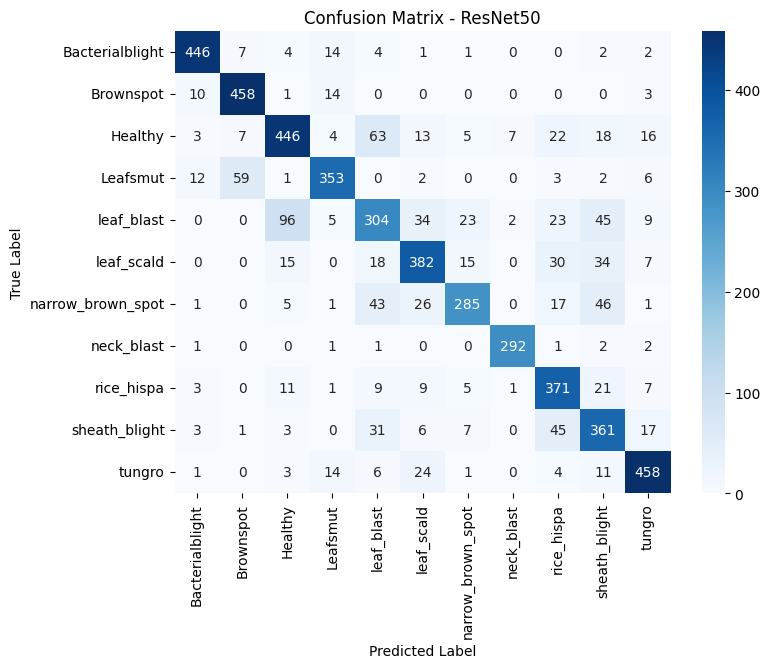

ResNet50 Evaluation:
F1 Score: 0.7963
Precision: 0.7988
Recall: 0.7977
------------------------------
41/41 ━━━━━━━━━━━━━━━━━━━━ 83s 2s/step - accuracy: 0.7936 - loss: 0.7446
Original model - Size: 93.63 MB, Accuracy: 0.7977, Inference time: 2030.27 ms per batch

Applying weight clustering...
95/95 ━━━━━━━━━━━━━━━━━━━━ 282s 3s/step - accuracy: 0.3398 - loss: 2.1136 - val_accuracy: 0.1599 - val_loss: 2.9345


41/41 ━━━━━━━━━━━━━━━━━━━━ 84s 2s/step - accuracy: 0.1566 - loss: 2.9518
Clustered model - Size: 93.63 MB, Accuracy: 0.1599, Inference time: 2050.28 ms per batch

Applying quantization...
INFO:tensorflow:Assets written to: C:\Users\MSC04\AppData\Local\Temp\tmpftlb9ldq\assets


INFO:tensorflow:Assets written to: C:\Users\MSC04\AppData\Local\Temp\tmpftlb9ldq\assets


Saved artifact at 'C:\Users\MSC04\AppData\Local\Temp\tmpftlb9ldq'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_392')
Output Type:
  TensorSpec(shape=(None, 11), dtype=tf.float32, name=None)
Captures:
  1709027202976: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1709027211776: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1709026806944: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1709026804304: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1709026806416: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1709026805184: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1709026819440: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1709026804480: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1709090950304: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1709090949776: TensorSpec(shape=(), dtype=tf.resource, name=None)
  

C:\Users\MSC04\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow\lite\python\interpreter.py:457: UserWarning:     Warning: tf.lite.Interpreter is deprecated and is scheduled for deletion in
    TF 2.20. Please use the LiteRT interpreter from the ai_edge_litert package.
    See the [migration guide](https://ai.google.dev/edge/litert/migration)
    for details.
    
  warnings.warn(_INTERPRETER_DELETION_WARNING)


Quantized model - Size: 23.06 MB, Accuracy: 0.1539, Inference time: 7468.49 ms per batch


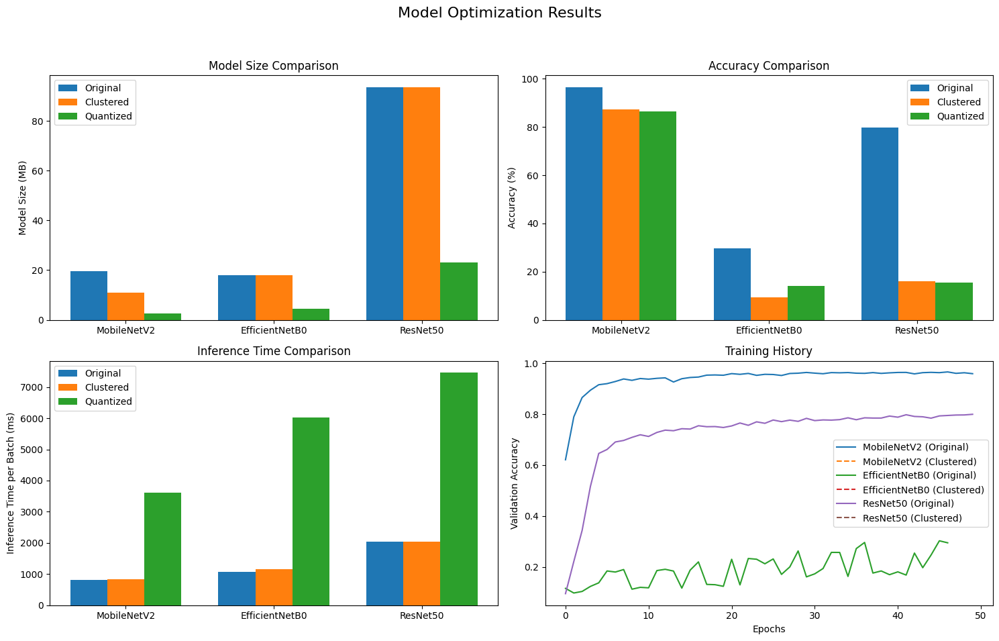


MODEL OPTIMIZATION SUMMARY
Model           Size (MB)                      Accuracy (%)                   Inference Time (ms)           
                 Original Clustered Quantized   Original Clustered Quantized   Original Clustered Quantized 
--------------------------------------------------------------------------------
MobileNetV2       19.61     11.07      2.55      96.58     87.33     86.33      820.70    837.99   3614.28  
EfficientNetB0    18.09     18.09      4.49      29.62      9.33     14.05     1077.71   1148.28   6014.83  
ResNet50          93.63     93.63     23.06      79.77     15.99     15.39     2030.27   2050.28   7468.49  


In [61]:

EPOCHHS=50
for name, base_model in models.items():
    print(f"\n{'-'*50}\nOptimizing model: {name}\n{'-'*50}")
    
    # Load and create the model
    print("Creating and training original model...")
    model = create_model(base_model,name)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    
    # Train the model
    early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    history = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHHS, callbacks=[early_stop])
    history_dict[name] = {'original': history.history}


    # Collect true labels
    y_true = np.concatenate([y for x, y in val_ds])
    
    # Get predictions
    y_pred_prob = model.predict(val_ds)
    y_pred = np.argmax(y_pred_prob, axis=1)

    # Plot confusion matrix
    plot_confusion_matrix(y_true, y_pred,name)

    evaluate_model(y_true, y_pred, model_name=name)

    
    # Save the unoptimized model's size, inference time, and accuracy
    temp_file = tempfile.NamedTemporaryFile(delete=False, suffix=".h5")
    model.save(temp_file.name)
    original_model_size = os.path.getsize(temp_file.name) / (1024 * 1024)  # Convert to MB
    
    start_time = time.time()
    _, original_accuracy = model.evaluate(val_ds)
    original_inference_time = (time.time() - start_time) / tf.data.experimental.cardinality(val_ds).numpy()  # per batch
    
    performance_metrics[name]['size']['original'] = original_model_size
    performance_metrics[name]['inference_time']['original'] = original_inference_time
    performance_metrics[name]['accuracy']['original'] = original_accuracy
    
    print(f"Original model - Size: {original_model_size:.2f} MB, Accuracy: {original_accuracy:.4f}, Inference time: {original_inference_time*1000:.2f} ms per batch")
    
    # Apply weight clustering (alternative to pruning, using standard Keras)
    print("\nApplying weight clustering...")
    
    # Rather than pruning (which requires tfmot), let's apply a simple weight clustering approach
    # We'll retrain with a smaller model as an approximation
    clustered_model = create_model(base_model)
    # Apply a constraint to the dense layers to simulate clustering effects
    for layer in clustered_model.layers:
        if isinstance(layer, tf.keras.layers.Dense):
            layer.kernel_constraint = tf.keras.constraints.UnitNorm(axis=0)
    
    clustered_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    clustering_history = clustered_model.fit(train_ds, validation_data=val_ds, 
                                     epochs=1, callbacks=[early_stop])
    history_dict[name]['clustered'] = clustering_history.history
    
    # Save the clustered model
    temp_file = tempfile.NamedTemporaryFile(delete=False, suffix=".h5")
    clustered_model.save(temp_file.name)
    clustered_model_size = os.path.getsize(temp_file.name) / (1024 * 1024)  # Convert to MB
    
    start_time = time.time()
    _, clustered_accuracy = clustered_model.evaluate(val_ds)
    clustered_inference_time = (time.time() - start_time) / tf.data.experimental.cardinality(val_ds).numpy()  # per batch
    
    performance_metrics[name]['size']['clustered'] = clustered_model_size
    performance_metrics[name]['inference_time']['clustered'] = clustered_inference_time
    performance_metrics[name]['accuracy']['clustered'] = clustered_accuracy
    
    print(f"Clustered model - Size: {clustered_model_size:.2f} MB, Accuracy: {clustered_accuracy:.4f}, Inference time: {clustered_inference_time*1000:.2f} ms per batch")
    
    # Apply quantization
    print("\nApplying quantization...")
    try:
        quantized_model = apply_quantization(clustered_model)
        # quantized_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
        # quantized_model_history = quantized_model.fit(train_ds, validation_data=val_ds, 
        #                              epochs=EPOCHS, callbacks=[early_stop])
        # Save the quantized model
        temp_file = tempfile.NamedTemporaryFile(delete=False, suffix=".tflite")
        with open(temp_file.name, 'wb') as f:
            f.write(quantized_model)
        quantized_model_size = os.path.getsize(temp_file.name) / (1024 * 1024)  # Convert to MB
        
        # Evaluate quantized model
        start_time = time.time()
        quantized_accuracy, _ = evaluate_tflite_model(quantized_model, val_ds)
        quantized_inference_time = (time.time() - start_time) / tf.data.experimental.cardinality(val_ds).numpy()  # per batch
        
        performance_metrics[name]['size']['quantized'] = quantized_model_size
        performance_metrics[name]['inference_time']['quantized'] = quantized_inference_time
        performance_metrics[name]['accuracy']['quantized'] = quantized_accuracy
        
        print(f"Quantized model - Size: {quantized_model_size:.2f} MB, Accuracy: {quantized_accuracy:.4f}, Inference time: {quantized_inference_time*1000:.2f} ms per batch")
    except Exception as e:
        print(f"Error during quantization: {e}")
        print("Skipping quantization for this model...")
        performance_metrics[name]['size']['quantized'] = None
        performance_metrics[name]['inference_time']['quantized'] = None
        performance_metrics[name]['accuracy']['quantized'] = None

# Plot results
plt.figure(figsize=(15, 10))
plt.suptitle("Model Optimization Results", fontsize=16)

# Plot 1: Model Size Comparison
plt.subplot(2, 2, 1)
model_names = list(performance_metrics.keys())
original_sizes = [performance_metrics[name]['size']['original'] for name in model_names]
clustered_sizes = [performance_metrics[name]['size']['clustered'] for name in model_names]
quantized_sizes = [performance_metrics[name]['size']['quantized'] if performance_metrics[name]['size']['quantized'] is not None else 0 for name in model_names]

x = np.arange(len(model_names))
width = 0.25

plt.bar(x - width, original_sizes, width, label='Original')
plt.bar(x, clustered_sizes, width, label='Clustered')
if any(s > 0 for s in quantized_sizes):
    plt.bar(x + width, quantized_sizes, width, label='Quantized')
plt.ylabel('Model Size (MB)')
plt.title('Model Size Comparison')
plt.xticks(x, model_names)
plt.legend()

# Plot 2: Accuracy Comparison
plt.subplot(2, 2, 2)
original_acc = [performance_metrics[name]['accuracy']['original'] * 100 for name in model_names]
clustered_acc = [performance_metrics[name]['accuracy']['clustered'] * 100 for name in model_names]
quantized_acc = [performance_metrics[name]['accuracy']['quantized'] * 100 if performance_metrics[name]['accuracy']['quantized'] is not None else 0 for name in model_names]

plt.bar(x - width, original_acc, width, label='Original')
plt.bar(x, clustered_acc, width, label='Clustered')
if any(a > 0 for a in quantized_acc):
    plt.bar(x + width, quantized_acc, width, label='Quantized')
plt.ylabel('Accuracy (%)')
plt.title('Accuracy Comparison')
plt.xticks(x, model_names)
plt.legend()

# Plot 3: Inference Time Comparison
plt.subplot(2, 2, 3)
original_time = [performance_metrics[name]['inference_time']['original'] * 1000 for name in model_names]  # ms
clustered_time = [performance_metrics[name]['inference_time']['clustered'] * 1000 for name in model_names]  # ms
quantized_time = [performance_metrics[name]['inference_time']['quantized'] * 1000 if performance_metrics[name]['inference_time']['quantized'] is not None else 0 for name in model_names]  # ms

plt.bar(x - width, original_time, width, label='Original')
plt.bar(x, clustered_time, width, label='Clustered')
if any(t > 0 for t in quantized_time):
    plt.bar(x + width, quantized_time, width, label='Quantized')
plt.ylabel('Inference Time per Batch (ms)')
plt.title('Inference Time Comparison')
plt.xticks(x, model_names)
plt.legend()

# Plot 4: Training History for a Selected Model
plt.subplot(2, 2, 4)
for i, name in enumerate(models.keys()):
    if 'original' in history_dict[name]:
        plt.plot(history_dict[name]['original']['val_accuracy'], 
                 label=f"{name} (Original)")
    if 'clustered' in history_dict[name]:
        plt.plot(history_dict[name]['clustered']['val_accuracy'], 
                 linestyle='--', label=f"{name} (Clustered)")
plt.xlabel("Epochs")
plt.ylabel("Validation Accuracy")
plt.title("Training History")
plt.legend()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Print summary table
print("\n" + "="*80)
print("MODEL OPTIMIZATION SUMMARY")
print("="*80)
print(f"{'Model':<15} {'Size (MB)':<30} {'Accuracy (%)':<30} {'Inference Time (ms)':<30}")
print(f"{'':^15} {'Original':^10}{'Clustered':^10}{'Quantized':^10} {'Original':^10}{'Clustered':^10}{'Quantized':^10} {'Original':^10}{'Clustered':^10}{'Quantized':^10}")
print("-"*80)

for name in model_names:
    org_size = performance_metrics[name]['size']['original']
    clst_size = performance_metrics[name]['size']['clustered']
    qnt_size = performance_metrics[name]['size']['quantized'] if performance_metrics[name]['size']['quantized'] is not None else 0
    
    org_acc = performance_metrics[name]['accuracy']['original'] * 100
    clst_acc = performance_metrics[name]['accuracy']['clustered'] * 100
    qnt_acc = performance_metrics[name]['accuracy']['quantized'] * 100 if performance_metrics[name]['accuracy']['quantized'] is not None else 0
    
    org_time = performance_metrics[name]['inference_time']['original'] * 1000
    clst_time = performance_metrics[name]['inference_time']['clustered'] * 1000
    qnt_time = performance_metrics[name]['inference_time']['quantized'] * 1000 if performance_metrics[name]['inference_time']['quantized'] is not None else 0
    
    print(f"{name:<15} {org_size:^10.2f}{clst_size:^10.2f}{qnt_size:^10.2f} {org_acc:^10.2f}{clst_acc:^10.2f}{qnt_acc:^10.2f} {org_time:^10.2f}{clst_time:^10.2f}{qnt_time:^10.2f}")

print("="*80)

In [62]:
for name in model_names:
    org_acc = performance_metrics[name]['accuracy']['original'] * 100
    clst_acc = performance_metrics[name]['accuracy']['clustered'] * 100
    qnt_acc = performance_metrics[name]['accuracy']['quantized'] * 100 if performance_metrics[name]['accuracy']['quantized'] is not None else 0
    
    print(f"{name:<15} {org_acc:^10.2f}{clst_acc:^10.2f}{qnt_acc:^10.2f}")

print("="*80)

MobileNetV2       96.58     87.33     86.33   
EfficientNetB0    29.62      9.33     14.05   
ResNet50          79.77     15.99     15.39   


## REST NET 50 Training

In [63]:
from tensorflow.keras.optimizers import Adam


In [64]:
# Function to train ResNet50 model separately
def train_resnet50(train_ds, val_ds, epochs, early_stop,learning_rate=0.001):
    print("\n" + "-"*50 + "\nTraining ResNet50 Model\n" + "-"*50)

    # Load and create the ResNet50 model
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=IMG_SIZE + (3,))
    for layer in base_model.layers:
        layer.trainable = False
    model = create_model(base_model)
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    # Train the model
    history = model.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=[early_stop])

    # Evaluate the model
    _, accuracy = model.evaluate(val_ds)
    print(f"ResNet50 Model - Accuracy: {accuracy:.4f}")

    # Quantization of the model
    try:
        quantized_model = apply_quantization(model)
        print("Quantization successful for ResNet50.")
        return model, history, quantized_model
    except Exception as e:
        print(f"Quantization failed for ResNet50: {e}")
        return model, history, None


# Main loop for other models (excluding ResNet50)
# for name, base_model in models.items():
#     if name == "ResNet50":
#         continue
#     print(f"\n{'-'*50}\nOptimizing model: {name}\n{'-'*50}")

#     # Load and create the model
#     print("Creating and training original model...")
#     model = create_model(base_model)
#     model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

#     # Train the model
#     early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

#     history = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=[early_stop])
#     history_dict[name] = {'original': history.history}

    # Continue with the rest of the optimization and evaluation as before...

# Separate training for ResNet50
early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
learning_rates = [0.001,0.0001,0.00005]
EPOCHS = 100
for rates in learning_rates:
    print("Current Learning Rate : ",rates)
    resnet50_model, resnet50_history, resnet50_quantized = train_resnet50(train_ds, val_ds, EPOCHS, early_stop,rates)
    # history_dict['ResNet50'] = {'original': resnet50_history.history}
    
resnet50_model, resnet50_history, resnet50_quantized = train_resnet50(train_ds, val_ds, EPOCHS, early_stop)
history_dict['ResNet50'] = {'original': resnet50_history.history}

if resnet50_quantized:
    print("Quantized ResNet50 model available.")
else:
    print("No quantized ResNet50 model.")

# Further optimization steps for ResNet50 can be added here if needed.


Current Learning Rate :  0.001

--------------------------------------------------
Training ResNet50 Model
--------------------------------------------------
Epoch 1/100
95/95 ━━━━━━━━━━━━━━━━━━━━ 284s 3s/step - accuracy: 0.3564 - loss: 2.0861 - val_accuracy: 0.1117 - val_loss: 3.2527
Epoch 2/100
95/95 ━━━━━━━━━━━━━━━━━━━━ 280s 3s/step - accuracy: 0.5175 - loss: 1.5163 - val_accuracy: 0.1633 - val_loss: 2.5786
Epoch 3/100
95/95 ━━━━━━━━━━━━━━━━━━━━ 281s 3s/step - accuracy: 0.5735 - loss: 1.3477 - val_accuracy: 0.3073 - val_loss: 2.0610
Epoch 4/100
95/95 ━━━━━━━━━━━━━━━━━━━━ 281s 3s/step - accuracy: 0.5956 - loss: 1.2664 - val_accuracy: 0.5125 - val_loss: 1.6180
Epoch 5/100
95/95 ━━━━━━━━━━━━━━━━━━━━ 280s 3s/step - accuracy: 0.6117 - loss: 1.2067 - val_accuracy: 0.6298 - val_loss: 1.3157
Epoch 6/100
95/95 ━━━━━━━━━━━━━━━━━━━━ 292s 3s/step - accuracy: 0.6361 - loss: 1.1522 - val_accuracy: 0.6651 - val_loss: 1.1359
Epoch 7/100
95/95 ━━━━━━━━━━━━━━━━━━━━ 294s 3s/step - accuracy: 0.6438 - l

INFO:tensorflow:Assets written to: C:\Users\MSC04\AppData\Local\Temp\tmp28bjsdjf\assets


Saved artifact at 'C:\Users\MSC04\AppData\Local\Temp\tmp28bjsdjf'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_612')
Output Type:
  TensorSpec(shape=(None, 11), dtype=tf.float32, name=None)
Captures:
  1721455281072: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721455695776: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721455699120: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721455697712: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721455695600: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721455705456: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1709065724224: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1709065728976: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1709089719920: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1709089718336: TensorSpec(shape=(), dtype=tf.resource, name=None)
  

INFO:tensorflow:Assets written to: C:\Users\MSC04\AppData\Local\Temp\tmp9vkz014p\assets


Saved artifact at 'C:\Users\MSC04\AppData\Local\Temp\tmp9vkz014p'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_792')
Output Type:
  TensorSpec(shape=(None, 11), dtype=tf.float32, name=None)
Captures:
  1721651121664: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721651119200: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721651122896: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721651124656: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721651120080: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721651123424: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721651121840: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721638533104: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721638534336: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721638529232: TensorSpec(shape=(), dtype=tf.resource, name=None)
  

INFO:tensorflow:Assets written to: C:\Users\MSC04\AppData\Local\Temp\tmpz3pqreih\assets


Saved artifact at 'C:\Users\MSC04\AppData\Local\Temp\tmpz3pqreih'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_972')
Output Type:
  TensorSpec(shape=(None, 11), dtype=tf.float32, name=None)
Captures:
  1721556764448: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721556763216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721556767440: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721556769200: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721556764624: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721556766208: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721556766384: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721282541376: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721282542608: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721282537504: TensorSpec(shape=(), dtype=tf.resource, name=None)
  

INFO:tensorflow:Assets written to: C:\Users\MSC04\AppData\Local\Temp\tmplg1ngpxf\assets


Saved artifact at 'C:\Users\MSC04\AppData\Local\Temp\tmplg1ngpxf'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_1152')
Output Type:
  TensorSpec(shape=(None, 11), dtype=tf.float32, name=None)
Captures:
  1721453129120: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721453131056: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721453120672: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721453130528: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721453131584: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721453128592: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721453096880: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721341698016: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721341697840: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1721341700128: TensorSpec(shape=(), dtype=tf.resource, name=None)
 